In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(6, 6))
sc.settings.verbosity = 3

-----
anndata     0.8.0
scanpy      1.9.1
-----
PIL                 9.2.0
asciitree           NA
asttokens           NA
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
cffi                1.15.1
cloudpickle         2.1.0
colorama            0.4.6
cycler              0.10.0
cython_runtime      NA
dask                2022.8.1
dateutil            2.8.2
debugpy             1.6.3
decorator           5.1.1
defusedxml          0.7.1
entrypoints         0.4
executing           1.2.0
fasteners           0.17.3
fsspec              2022.7.1
google              NA
h5py                3.7.0
hypergeom_ufunc     NA
igraph              0.9.11
ipykernel           6.17.1
ipython_genutils    0.2.0
ipywidgets          8.0.1
jedi                0.18.1
jinja2              3.1.2
joblib              1.2.0
jupyter_server      1.23.1
kiwisolver          1.4.4
leidenalg           0.8.10
llvmlite            0.39.1
louvain             0.7.1
lz4                 4.0.2
markupsafe          2.1.

In [3]:
adata = sc.read_visium("./lymph/V1_Human_Lymph_Node")
adata

reading lymph/V1_Human_Lymph_Node/filtered_feature_bc_matrix.h5
 (0:00:01)


/home/yc/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 4035 × 36601
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [4]:
# Calculate qc matrics
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [5]:
adata.obs

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt
AAACAAGTATCTCCCA-1,1,50,102,6732,8.814776,27944.0,10.237993,33.241483,41.071429,48.375322,57.572287,248.0,5.517453,0.887489
AAACAATCTACTAGCA-1,1,3,43,6759,8.818778,25685.0,10.153702,23.507884,33.965349,42.631886,53.054312,239.0,5.480639,0.930504
AAACACCAATAACTGC-1,1,59,19,8590,9.058470,42942.0,10.667629,22.502445,31.770761,40.584975,50.815053,473.0,6.161207,1.101486
AAACAGAGCGACTCCT-1,1,14,94,7236,8.886962,31916.0,10.370894,21.948239,31.990224,41.101642,52.603710,348.0,5.855072,1.090362
AAACAGCTTTCAGAAG-1,1,43,9,6890,8.837971,30932.0,10.339579,26.357817,38.132032,47.575327,57.590844,793.0,6.677083,2.563688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1,1,58,42,5771,8.660774,19649.0,9.885833,27.131152,35.950939,44.429742,55.000254,209.0,5.347107,1.063667
TTGTTTCATTAGTCTA-1,1,60,30,6354,8.756997,21557.0,9.978502,24.238067,32.263302,40.265343,51.152758,208.0,5.342334,0.964884
TTGTTTCCATACAACT-1,1,45,27,6517,8.782323,22175.0,10.006766,21.506201,30.593010,39.098083,50.119504,192.0,5.262690,0.865840
TTGTTTGTATTACACG-1,1,73,41,4476,8.406708,12268.0,9.414831,24.078904,34.268014,43.193675,54.964134,121.0,4.804021,0.986306


In [6]:
adata

AnnData object with n_obs × n_vars = 4035 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

<AxesSubplot: xlabel='n_genes_by_counts', ylabel='Count'>

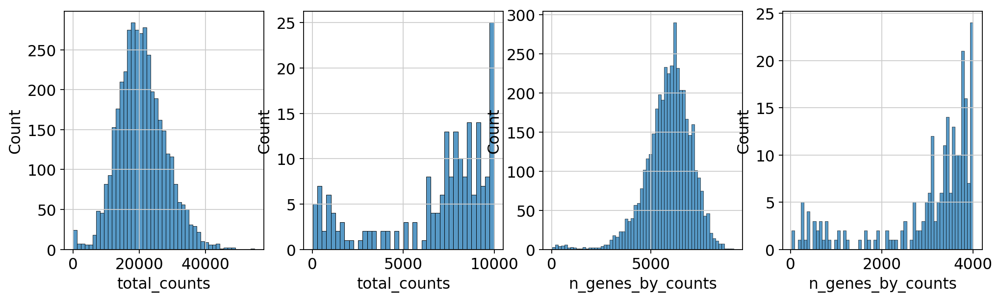

In [7]:
# qc plotting: histplot
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(adata.obs["total_counts"][adata.obs["total_counts"] < 10000], kde=False, bins=40, ax=axs[1])
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000], kde=False, bins=60, ax=axs[3])

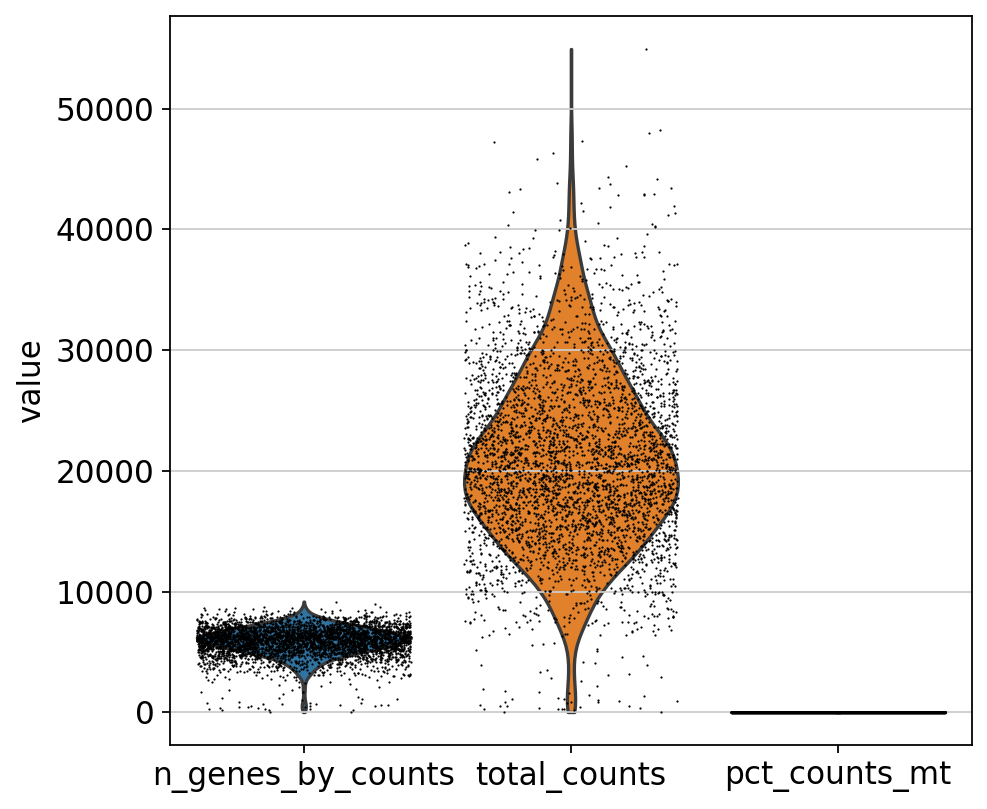

In [8]:
# violin plot of the pct_counts_mt
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4)

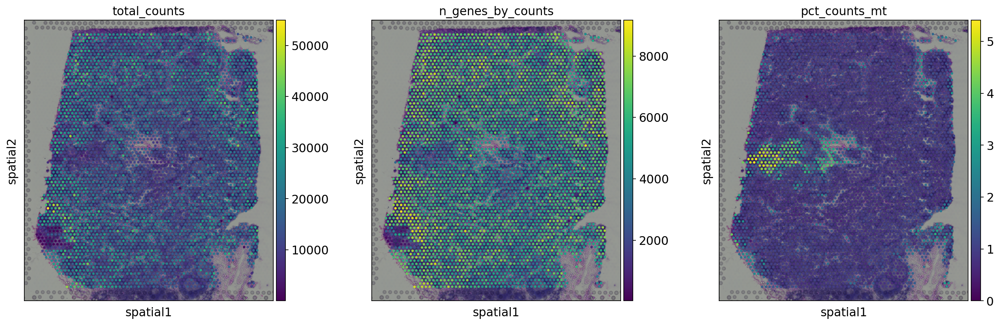

In [10]:
sc.pl.spatial(adata, color = ["total_counts", "n_genes_by_counts",'pct_counts_mt'])

In [12]:
# filting: min_counts, max_counts, mt, min_cells
sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20]
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

filtered out 44 cells that have less than 5000 counts
filtered out 130 cells that have more than 35000 counts
#cells after MT filter: 3861
filtered out 16916 genes that are detected in less than 10 cells


/home/yc/miniconda3/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


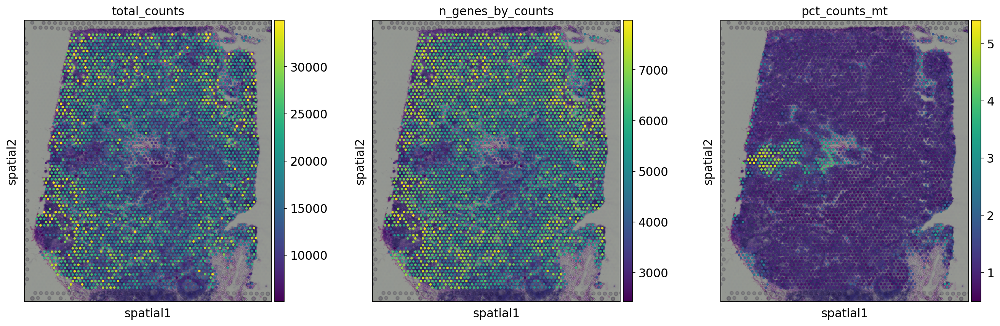

In [13]:
sc.pl.spatial(adata, color = ["total_counts", "n_genes_by_counts",'pct_counts_mt'])

In [14]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [15]:
sc.pp.pca(adata) # Defaults to 50
sc.pp.neighbors(adata) # n_neighbors : int (default: 15)
sc.tl.umap(adata) # min_dist : float (default: 0.5)
sc.tl.leiden(adata, key_added="leiden") # resolution : float (default: 1)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50


2023-02-11 11:16:47.251293: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-11 11:16:47.775900: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-02-11 11:16:47.990196: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-02-11 11:16:49.011719: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/home/yc/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


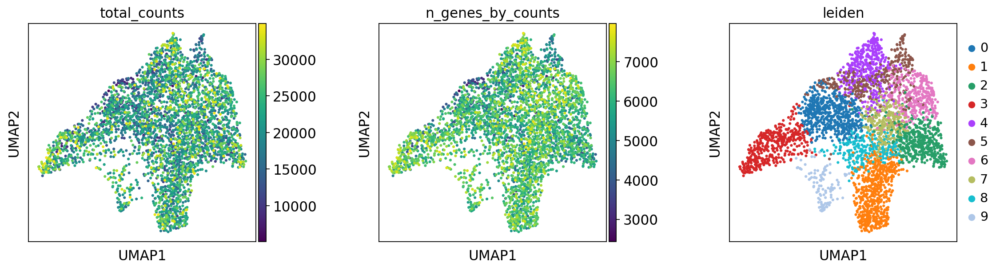

In [16]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "leiden"], wspace=0.4)

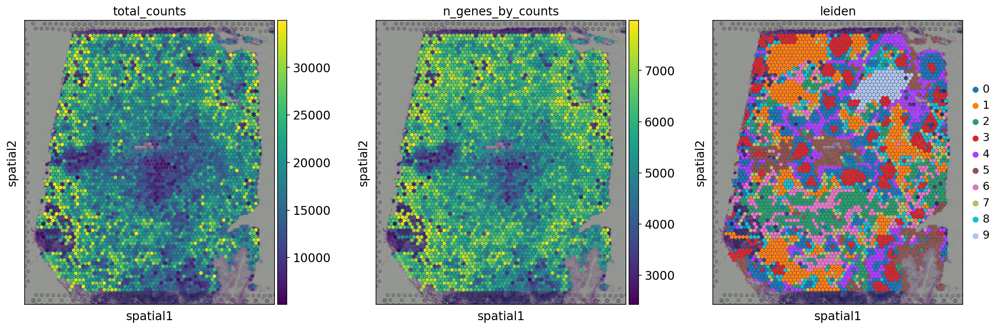

In [20]:
plt.rcParams["figure.figsize"] = (6, 6)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts", "leiden"], size=1.5)

In [38]:
adata.obs.leiden.unique()

['2', '1', '9', '0', '8', '6', '4', '5', '3', '7']
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

categories: 0, 1, 2, etc.
var_group_labels: 2


/home/yc/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


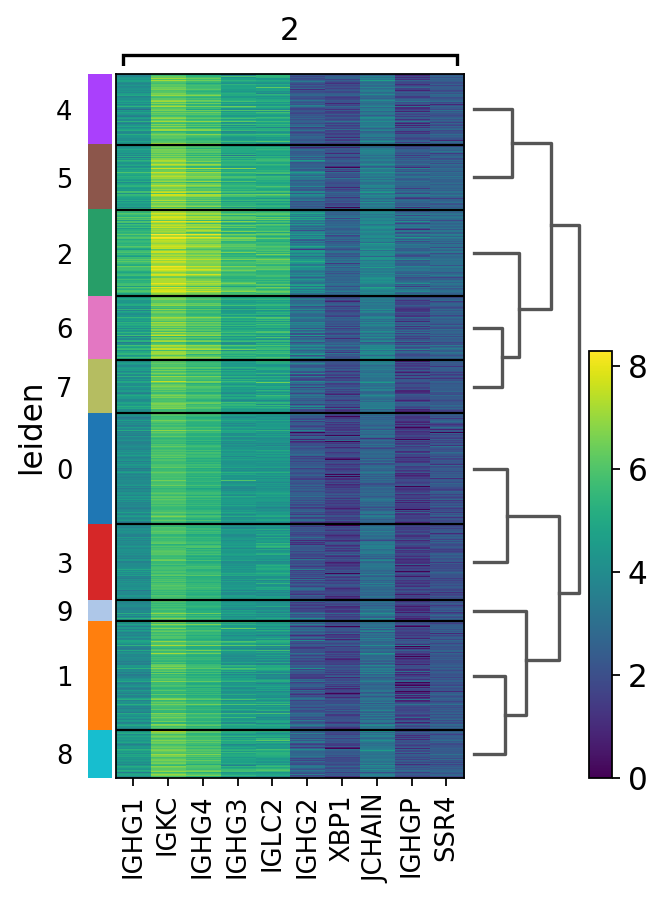

categories: 0, 1, 2, etc.
var_group_labels: 1


/home/yc/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


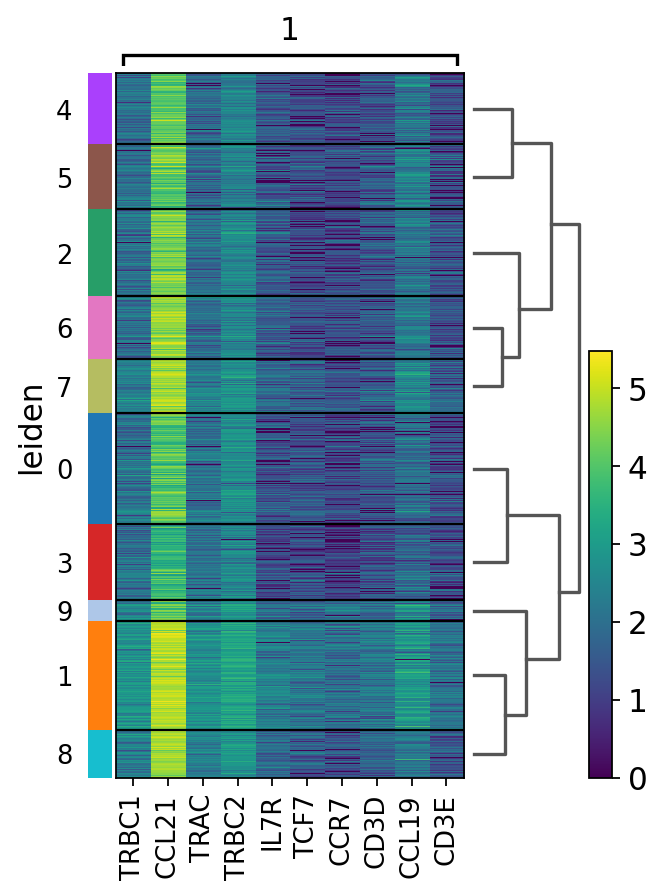

categories: 0, 1, 2, etc.
var_group_labels: 9


/home/yc/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


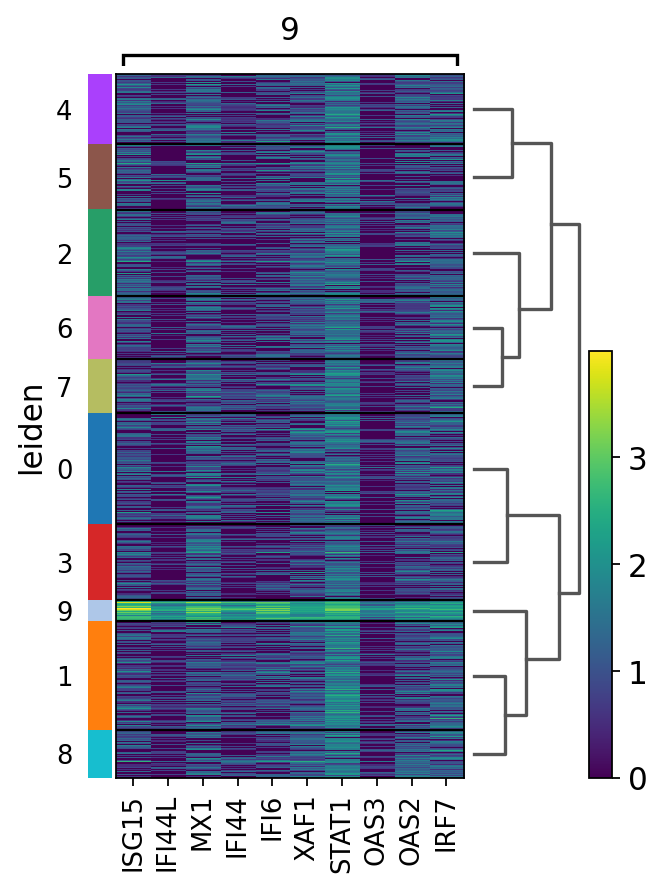

categories: 0, 1, 2, etc.
var_group_labels: 0


/home/yc/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


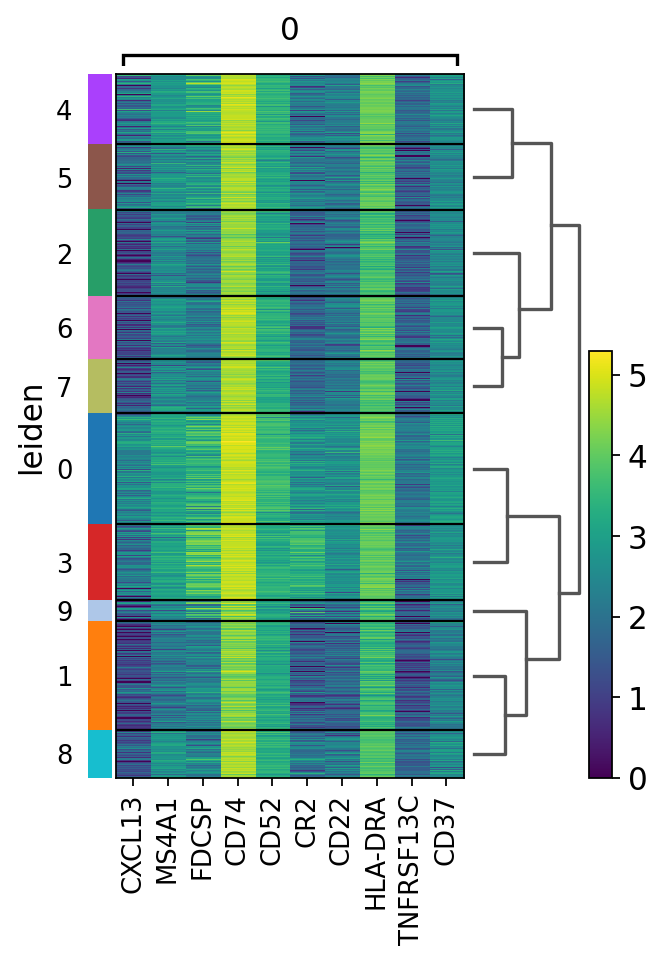

categories: 0, 1, 2, etc.
var_group_labels: 8


/home/yc/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


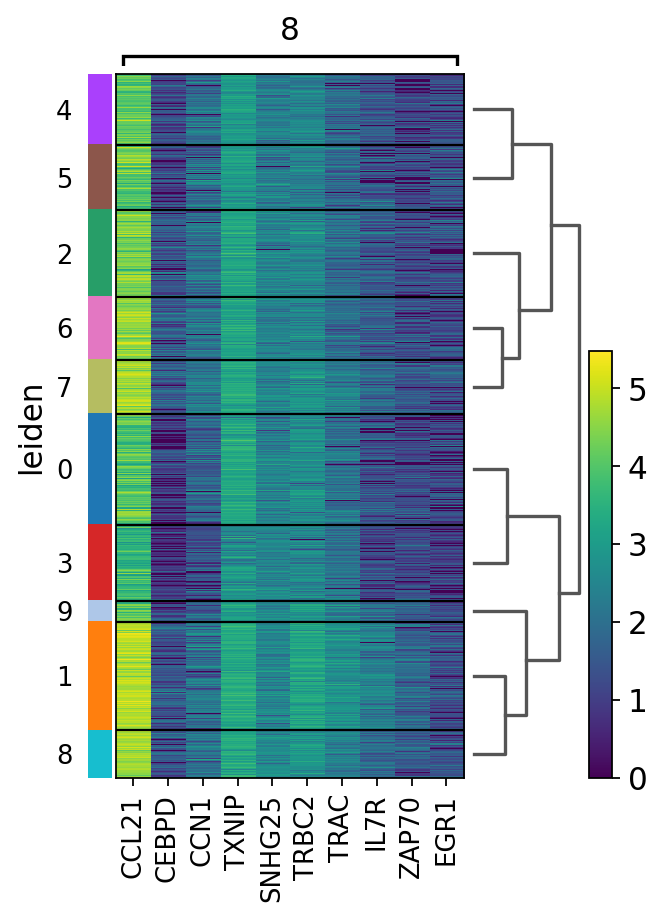

categories: 0, 1, 2, etc.
var_group_labels: 6


/home/yc/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


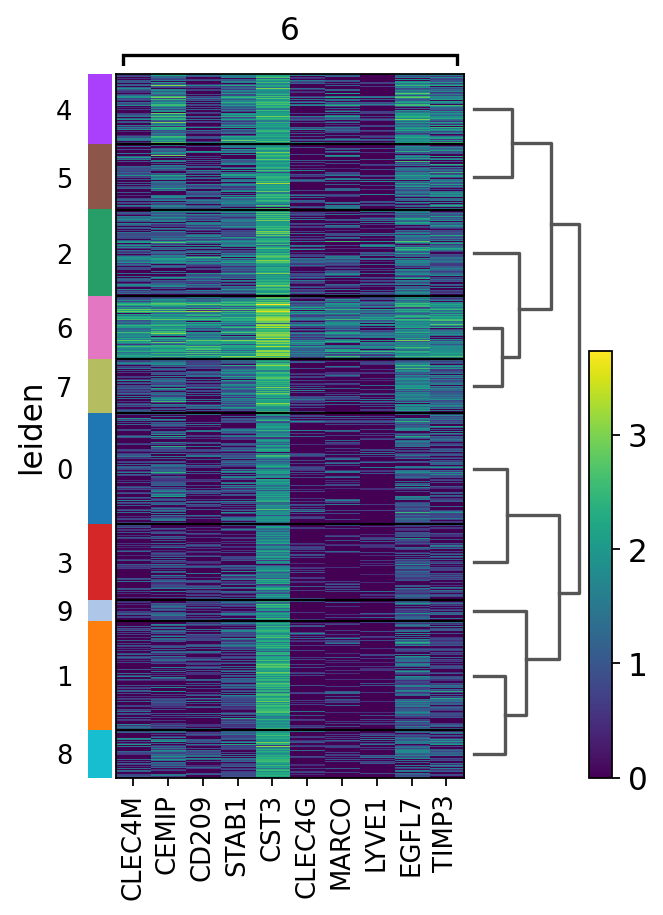

categories: 0, 1, 2, etc.
var_group_labels: 4


/home/yc/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


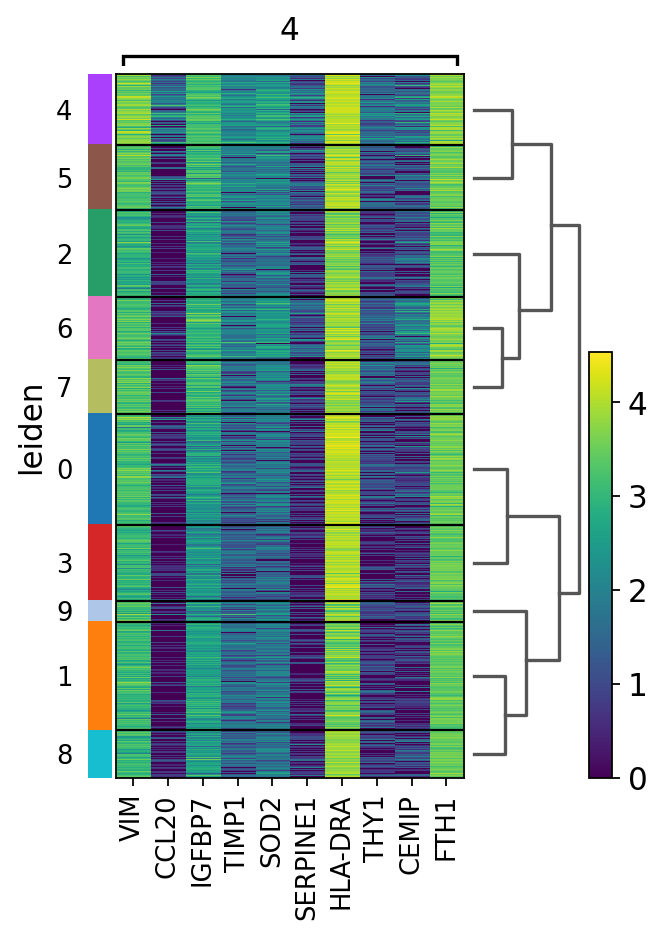

categories: 0, 1, 2, etc.
var_group_labels: 5


/home/yc/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


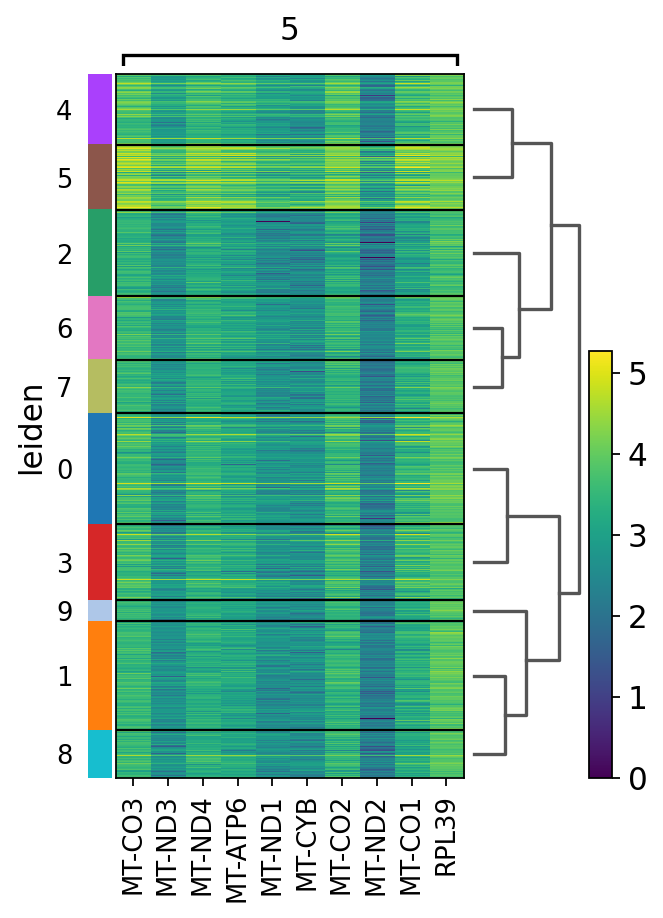

categories: 0, 1, 2, etc.
var_group_labels: 3


/home/yc/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


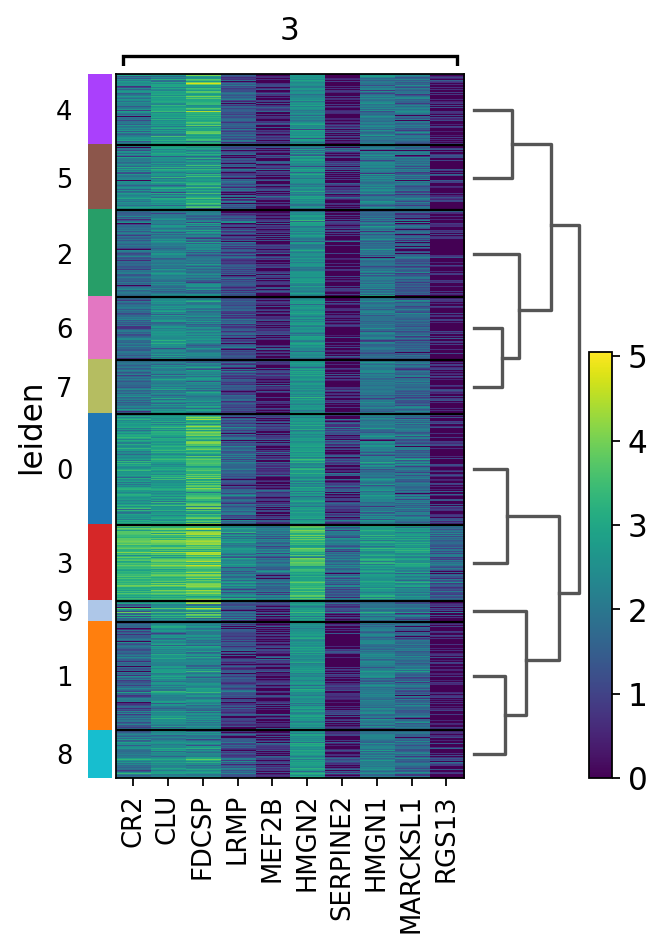

categories: 0, 1, 2, etc.
var_group_labels: 7


/home/yc/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


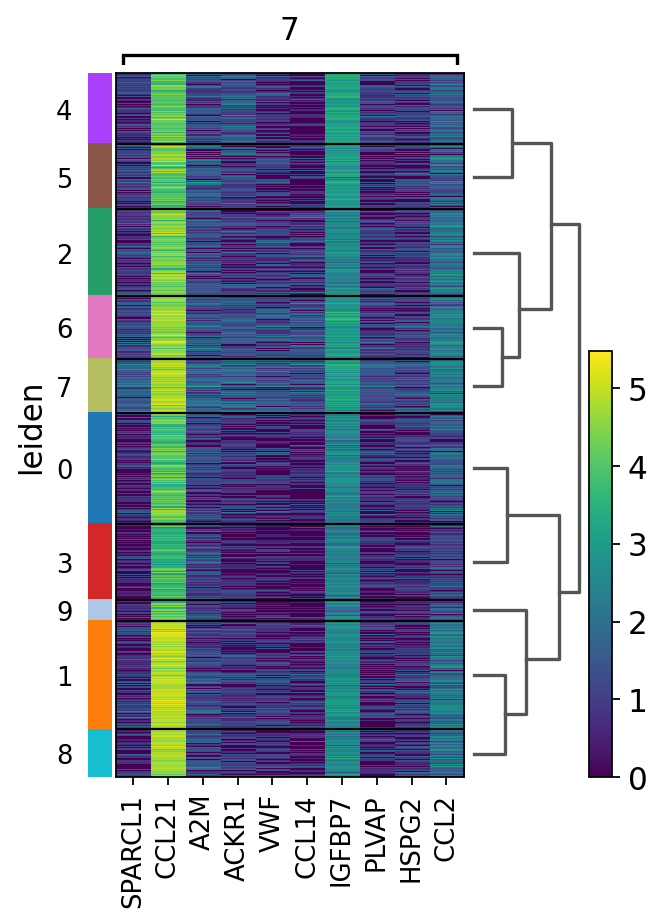

In [39]:
for grp in adata.obs.leiden.unique():
 sc.pl.rank_genes_groups_heatmap(adata, groups=grp, n_genes=10, groupby="leiden")

In [50]:
#Plot marker genes. The marker genes must be in the gene record. 

markers = {'b-cell': ['BLNK', 'BTK‘,’CD19’,’CD79A’,’CD79B’,’CR2’,’FCGR2B’,’IGHG3’,’IGHM'],
't_cell': ['CD247’, ‘CD28’, ‘CD3D’, ‘CD3E’, ‘CD3G’, ‘CD4’, ‘CD40LG’, ‘CD8A’, ‘CD8B1’, ‘ICOS’, ‘ZAP70'],
'house_keeping': ['RPL37A‘,’B2M’,’HMBS’,’STX5A’,’PSMB2’,’HNRNPAB’,’ACTB’,’QARS'],
'mac': ['CSF1R’,’CD45’, ‘SIGLEC1’,’ CD48’,’LYZ2’,’FOS’,’NR4A1’,’LY6E']}

markers2 = ['C1QA', 'PSAP', 'CD79A', 'CD79B', 'CST3', 'LYZ']

/home/yc/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


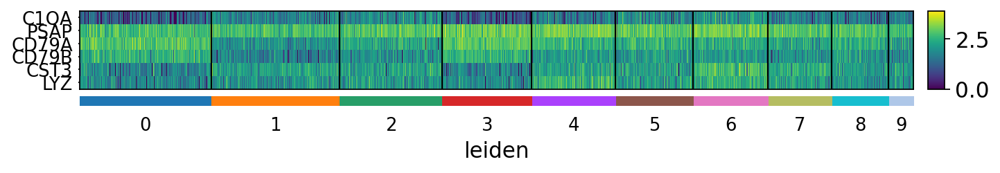

In [51]:
sc.pl.heatmap(adata, markers2, groupby='leiden', swap_axes=True)

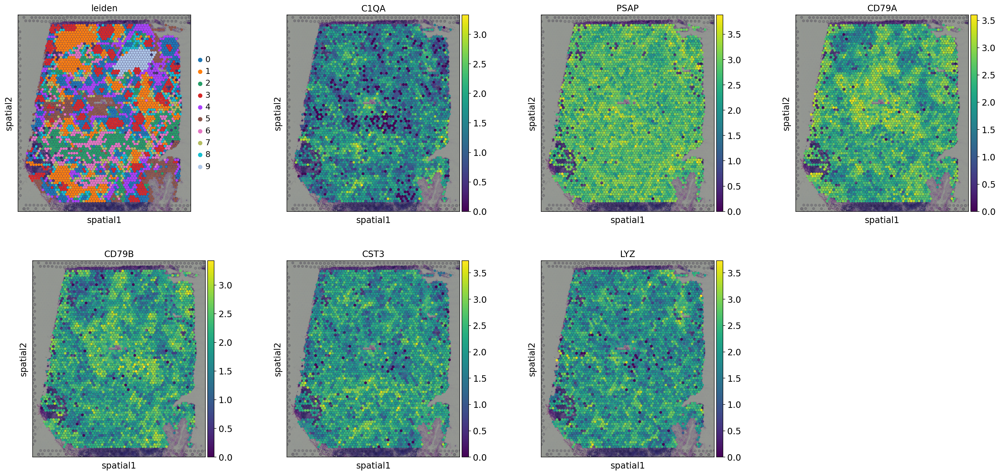

In [52]:
sc.pl.spatial(adata, img_key="hires", color=["leiden",'C1QA', 'PSAP', 'CD79A', 'CD79B', 'CST3', 'LYZ'], size=1.5,)